# Temporal recalibration project

kcho, Friday, September 22, 2017

## Import libraries

In [471]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from peakutils.peak import indexes
import scipy.interpolate as interpolate
from scipy.signal import butter, lfilter, freqz, find_peaks_cwt
import peakutils


%matplotlib inline

> Data from DH

In [12]:
ls

README.md                   park_5_exp_1_dataLog.txt
Untitled.ipynb              park_5_exp_2_dataLog.txt
park_3_2_exp_0_dataLog.txt  park_5_exp_3_dataLog.txt
park_3_2_exp_1_dataLog.txt  park_5_exp_4_dataLog.txt
park_5_exp_0_dataLog.txt


## 1. Load data

In [13]:
data = pd.read_csv('park_3_2_exp_1_dataLog.txt', sep=',')

> How the raw data looks

In [14]:
data.head()

,time[us],volt(fsr)[v],signal,signal frequency[Hz]
0,221869028,0,0,1000
1,221869389,0,0,1000
2,221869750,0,0,1000
3,221870110,0,0,1000
4,221870470,0,0,1000


## 2. Data observation

> Data shape

In [15]:
data.shape

(217711, 4)

> `time[us]` column

In [16]:
data['time[us]'].head()

0    221869028
1    221869389
2    221869750
3    221870110
4    221870470
Name: time[us], dtype: int64

- Range of the time

In [17]:
print('starts from : {}\nends at : {}'.format(
    data['time[us]'].min(), 
    data['time[us]'].max()))

starts from : 221869028
ends at : 300492272


- Increasement in the time axis

    - eg) t2 - t1

In [18]:
np.ediff1d(data['time[us]'])

array([361, 361, 360, ..., 360, 361, 361])

- Unique values of the time increasement

In [19]:
np.unique(np.ediff1d(data['time[us]']))

array([ 358,  359,  360,  361,  362,  363,  364,  365,  366,  367,  368,
        369,  370,  371, 1060, 1061])

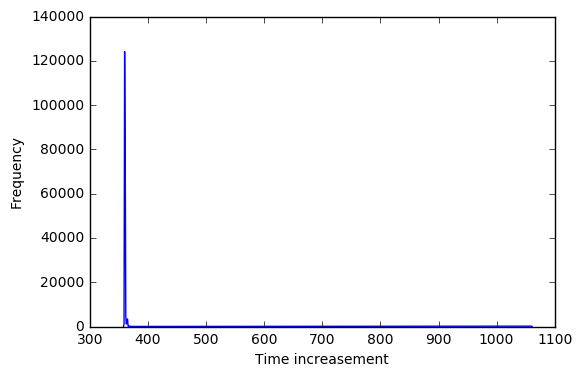

In [42]:
tmp = pd.DataFrame(np.ediff1d(data['time[us]']))
tmp.columns = ['time increasement']
tmp = tmp.reset_index() 
plt.plot(tmp.groupby('time increasement').count().index, tmp.groupby('time increasement').count()['index'])
plt.ylabel('Frequency')
plt.xlabel('Time increasement')

In [629]:
tmp.groupby('time increasement').count().T

time increasement,358,359,360,361,362,363,364,365,366,367,368,369,370,371,1060,1061
index,4,1025,124161,79961,4341,1134,2741,3423,104,184,188,96,150,23,155,20


In [33]:
tmp.groupby('time increasement').count().index

Int64Index([ 358,  359,  360,  361,  362,  363,  364,  365,  366,  367,  368,
             369,  370,  371, 1060, 1061],
           dtype='int64', name='time increasement')

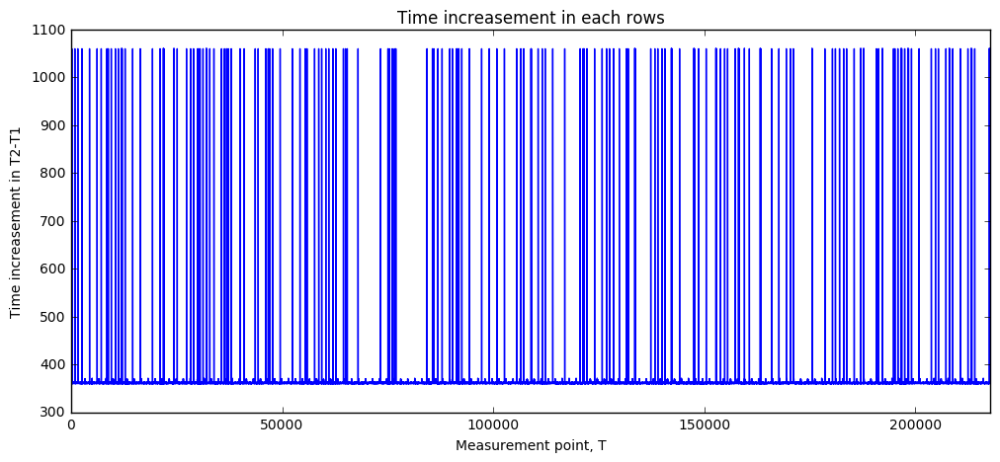

In [50]:
plt.figure(figsize=(12,5))
plt.plot(np.ediff1d(data['time[us]']))
plt.title('Time increasement in each rows')
plt.xlim(0, len(tmp))
plt.xlabel('Measurement point, T')
plt.ylabel('Time increasement in T2-T1')
plt.show()

- Above shows that the time column is sparse

## 3. Interpolation

In [631]:
f = interpolate.interp1d(data['time[us]'], data['volt(fsr)[v]'])
gap = 360
y = f(np.arange(data['time[us]'].min(), data['time[us]'].max(), gap))

f_signal = interpolate.interp1d(data['time[us]'], data['signal'], kind='nearest')
y_signal = f_signal(np.arange(data['time[us]'].min(), data['time[us]'].max(), gap))

> Data size before the interpolation

In [632]:
len(data)

217711

> Data size after the interpolation

In [633]:
len(y)

218398

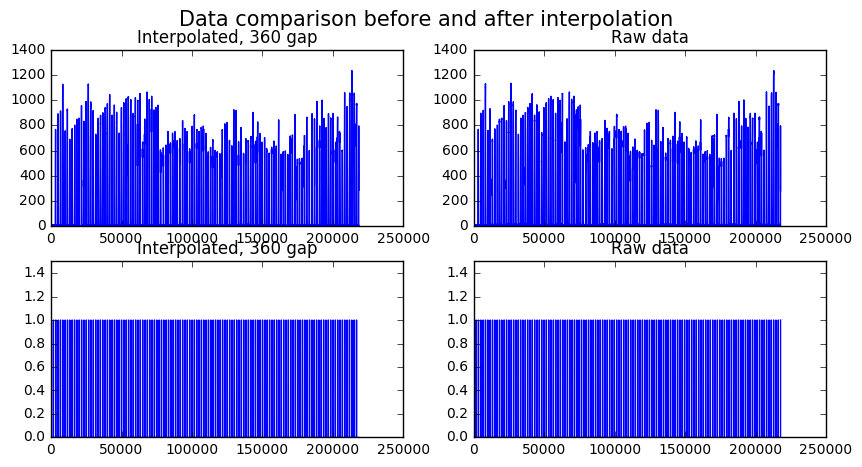

In [637]:
fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(10,5))
ax = np.ravel(ax)
ax[0].plot(y)
ax[0].set_title('Interpolated, 360 gap')
ax[1].plot(data['volt(fsr)[v]'])
ax[1].set_title('Raw data')

ax[2].plot(y_signal)
ax[2].set_title('Interpolated, 360 gap')
ax[2].set_ylim(0,1.5)
ax[3].plot(data['signal'])
ax[3].set_title('Raw data')
ax[3].set_ylim(0,1.5)

plt.suptitle('Data comparison before and after interpolation', fontsize=15)
plt.show()

> Save the interpolated as `data_reponse_interp_360`

In [829]:
data_reponse_interp_360 = pd.DataFrame({'time[us]':np.arange(data['time[us]'].min(), data['time[us]'].max(), gap),
                                        'volt(fsr)[v]':y,
                                        'signal':y_signal})

## 5. Threshold the response

In [830]:
threshold = 80
data_reponse_interp_360.loc[data_reponse_interp_360['volt(fsr)[v]'] < 80, 'volt(fsr)[v]'] = 0 

## 7. Split the dataframe

In [1030]:
# difference between consecutive element
pre_post_signal_diff = np.ediff1d(data_reponse_interp_360['signal'])

# where the difference is +1 : Signal turning on (0 --> 1)
# 1 has been added to return the index of first 'on'
signal_first_ones_index = np.where(pre_post_signal_diff==1)[0] + 1
signal_first_ones_time = data_reponse_interp_360.loc[signal_first_ones_index, 'time[us]'].values

signal_last_ones_index = np.where(pre_post_signal_diff==-1)[0]
signal_last_ones_time = data_reponse_interp_360.loc[signal_last_ones_index, 'time[us]'].values

# 300 ms
# need to make this multiples of 360
cut_window_div = 300000 / 360
cut_time = signal_first_ones_index - round(cut_window_div)

data_split = np.split(data_reponse_interp_360, 
                      cut_time)[1:]

In [1031]:
len(data_split)

130

## 8. Find peaks in each epochs

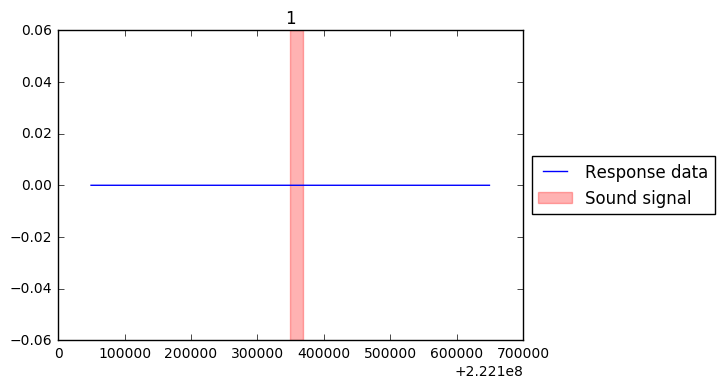

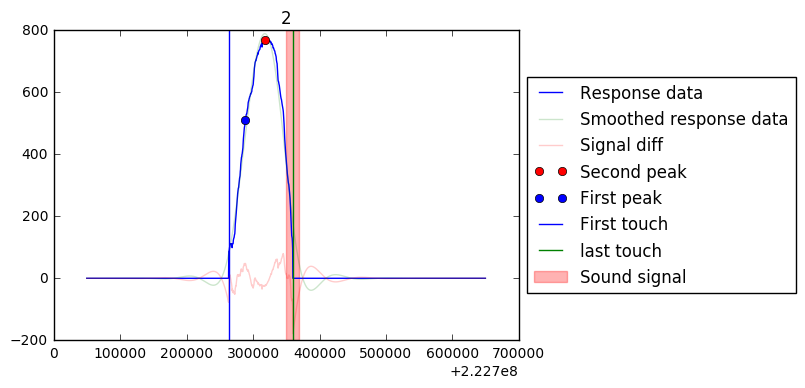

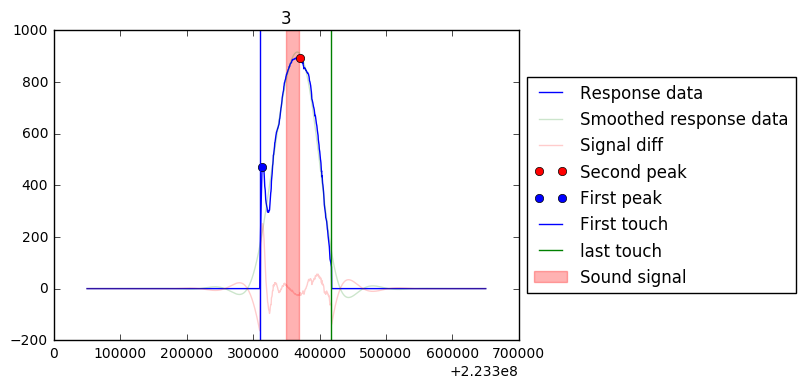

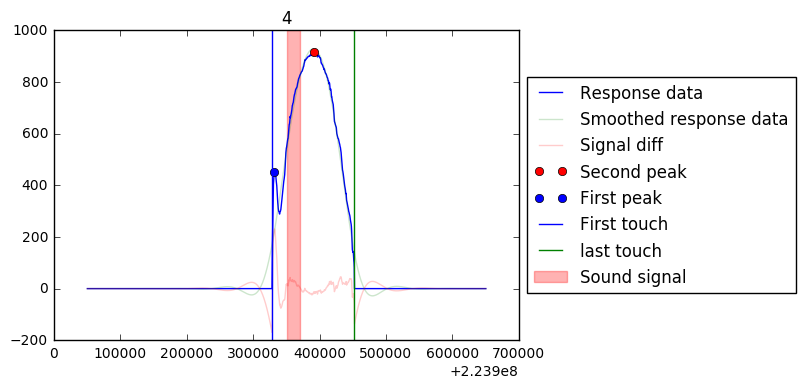

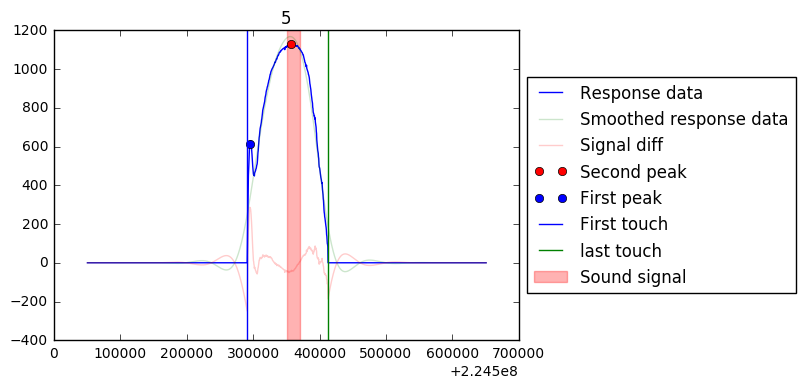

...

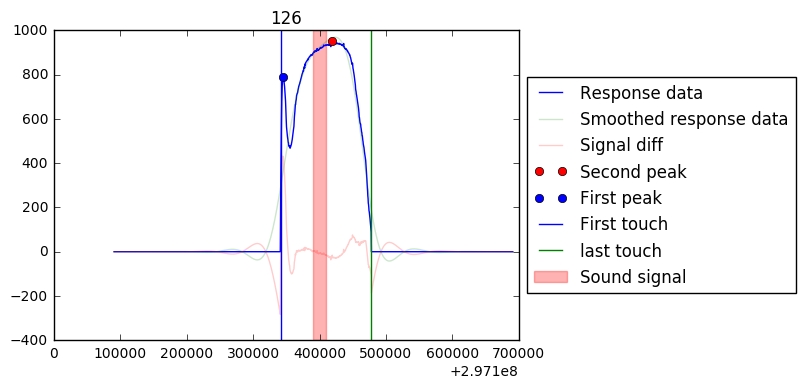

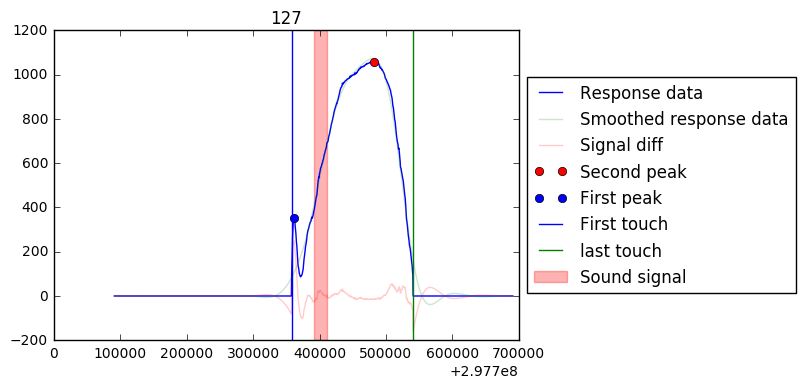

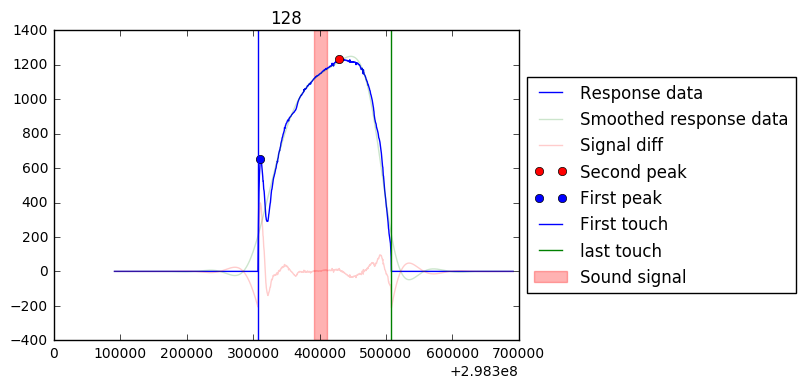

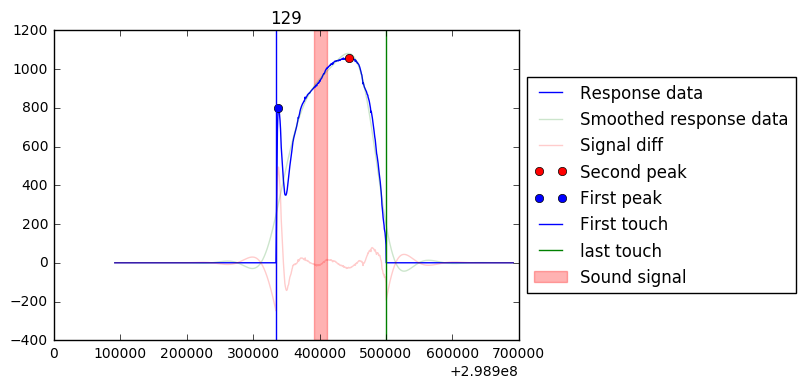

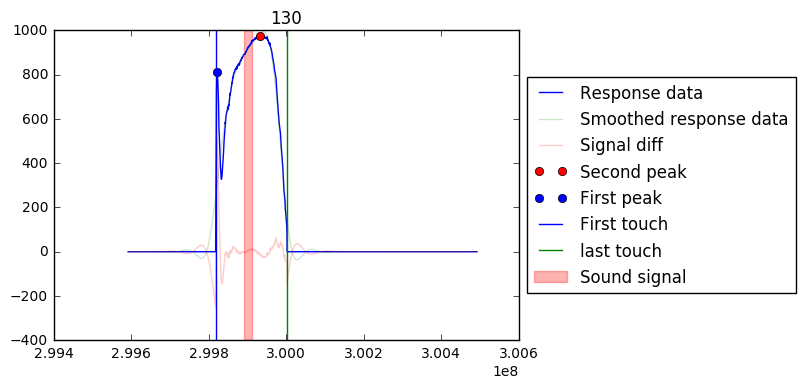

Error epochs :  2 46
Missing epochs :  1


In [1075]:
missing_epochs = []
error_epochs = []
for num, df_tmp in enumerate(data_split, 1):
    if len(df_tmp[df_tmp['volt(fsr)[v]'] > 80]) == 0:
        missing_epochs.append(num)
        plt.plot(df_tmp['time[us]'], df_tmp['volt(fsr)[v]'], label='Response data')
        plt.axvspan(df_tmp[df_tmp['signal']!=0]['time[us]'].values[0], 
                    df_tmp[df_tmp['signal']!=0]['time[us]'].values[-1], 
                    color='r', alpha=0.3, label = 'Sound signal')
        plt.title(num)
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        plt.show()
        continue
        
    # if there are more than two responses
    elif np.any(np.diff(df_tmp[df_tmp['volt(fsr)[v]'] > 80].index)!=1):
        cut_index_thr = np.diff(df_tmp[df_tmp['volt(fsr)[v]'] > 80].index).argmax()
        cut_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[cut_index_thr]

        # select longer part of the response
        first_df_tmp = df_tmp.ix[:cut_index]
        second_df_tmp = df_tmp.ix[cut_index:]
        get_longer_df = lambda x,y : x if len(x[x['volt(fsr)[v]']>80]) > len(y[y['volt(fsr)[v]']>80]) else y
        new = get_longer_df(first_df_tmp, second_df_tmp)
        new = new.reindex_like(df_tmp)
        new['time[us]'] = df_tmp['time[us]']
        new['signal'] = df_tmp['signal']
        df_tmp = new
        df_tmp.ix[df_tmp.index[df_tmp.isnull()['volt(fsr)[v]']], 'volt(fsr)[v]'] = 0
        
            
    # first contact 
    first_touch_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[0]
    # last contact
    last_touch_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[-1]

    # Estimating second peak
    # Smooth data : strong smoothing
    b, a = signal.butter(4, 0.01)
    df_tmp['svolt(fsr)[v]'] = signal.filtfilt(b, a, df_tmp['volt(fsr)[v]'])

    max_response_index_from_strong_smoothing = df_tmp['svolt(fsr)[v]'].idxmax()
    second_window_time = 50
    lower_window_bound_2nd_peak = max_response_index_from_strong_smoothing - second_window_time
    higher_window_bound_2nd_peak = max_response_index_from_strong_smoothing + second_window_time
    second_peak_value = df_tmp['volt(fsr)[v]'].ix[lower_window_bound_2nd_peak:higher_window_bound_2nd_peak].max()
    second_peak_index = df_tmp['volt(fsr)[v]'].ix[lower_window_bound_2nd_peak:higher_window_bound_2nd_peak].idxmax()
    second_peak_time = df_tmp.ix[second_peak_index, 'time[us]']

    # First peak
    # must appear before the second peak
    first_peak_index = (df_tmp['volt(fsr)[v]'] - df_tmp['svolt(fsr)[v]']).ix[:second_peak_index].idxmax()
    first_peak_value = df_tmp.ix[first_peak_index, 'volt(fsr)[v]']
    first_peak_time = df_tmp.ix[first_peak_index, 'time[us]']

    # If first peak is far from the first touch
    if (first_peak_index - first_touch_index) > 25:
        error_epochs.append(num)

        
    # Plot gradient
    plt.plot(df_tmp['time[us]'], 
             df_tmp['volt(fsr)[v]'], label='Response data')
    plt.plot(df_tmp['time[us]'], 
             df_tmp['svolt(fsr)[v]'], alpha=0.2, label='Smoothed response data')
    plt.plot(df_tmp['time[us]'], 
             df_tmp['volt(fsr)[v]'] - df_tmp['svolt(fsr)[v]'], 
             alpha=0.2, label='Signal diff')
    plt.plot(second_peak_time, second_peak_value, 'ro', label='Second peak')
    plt.plot(first_peak_time, first_peak_value, 'bo', label='First peak')
    plt.axvspan(df_tmp[df_tmp['signal']!=0]['time[us]'].values[0], 
                df_tmp[df_tmp['signal']!=0]['time[us]'].values[-1], 
                color='r', alpha=0.3, label = 'Sound signal')
    plt.axvline(df_tmp.ix[first_touch_index, 'time[us]'], label = 'First touch')
    plt.axvline(df_tmp.ix[last_touch_index, 'time[us]'], color='green', label = 'last touch')
    plt.title(num)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))


    plt.show()

print('Error epochs : ', ' '.join([str(x) for x in error_epochs]))
print('Missing epochs : ', ' '.join([str(x) for x in missing_epochs]))

> Save the df

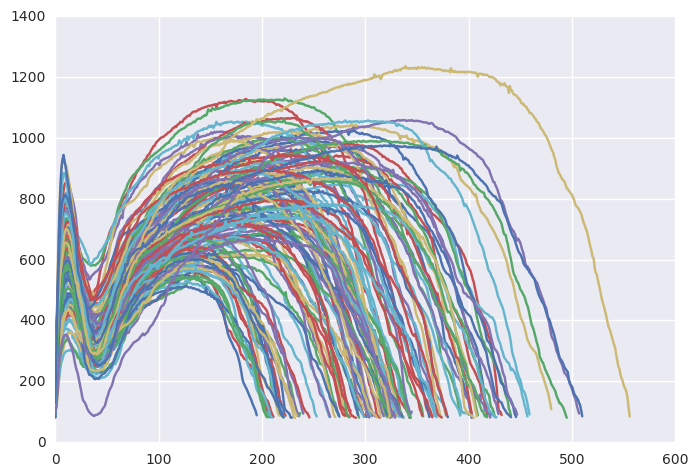

In [1196]:
response_only_df = pd.DataFrame()
timing_df = pd.DataFrame()
timing_diff_df = pd.DataFrame()
for num, df_tmp in enumerate(data_split, 1):
    if len(df_tmp[df_tmp['volt(fsr)[v]'] > 80]) == 0:
        missing_epochs.append(num)
        continue
        
    # if there are more than two responses
    elif np.any(np.diff(df_tmp[df_tmp['volt(fsr)[v]'] > 80].index)!=1):
        cut_index_thr = np.diff(df_tmp[df_tmp['volt(fsr)[v]'] > 80].index).argmax()
        cut_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[cut_index_thr]

        # select longer part of the response
        first_df_tmp = df_tmp.ix[:cut_index]
        second_df_tmp = df_tmp.ix[cut_index:]
        get_longer_df = lambda x,y : x if len(x[x['volt(fsr)[v]']>80]) > len(y[y['volt(fsr)[v]']>80]) else y
        new = get_longer_df(first_df_tmp, second_df_tmp)
        new = new.reindex_like(df_tmp)
        new['time[us]'] = df_tmp['time[us]']
        new['signal'] = df_tmp['signal']
        df_tmp = new
        df_tmp.ix[df_tmp.index[df_tmp.isnull()['volt(fsr)[v]']], 'volt(fsr)[v]'] = 0

    # first contact 
    first_touch_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[0]
    first_touch_time = df_tmp.ix[first_touch_index, 'time[us]']
    # last contact
    last_touch_index = df_tmp[df_tmp['volt(fsr)[v]'] > 80].index.values[-1]
    last_touch_time = df_tmp.ix[last_touch_index, 'time[us]']
    
    # sound first
    first_sound_index = df_tmp[df_tmp['signal']!=0].index.values[0]
    first_sound_time = df_tmp.ix[first_sound_index, 'time[us]']
    
    # Estimating second peak
    # Smooth data : strong smoothing
    b, a = signal.butter(4, 0.01)
    df_tmp['svolt(fsr)[v]'] = signal.filtfilt(b, a, df_tmp['volt(fsr)[v]'])

    max_response_index_from_strong_smoothing = df_tmp['svolt(fsr)[v]'].idxmax()
    second_window_time = 50
    lower_window_bound_2nd_peak = max_response_index_from_strong_smoothing - second_window_time
    higher_window_bound_2nd_peak = max_response_index_from_strong_smoothing + second_window_time
    second_peak_value = df_tmp['volt(fsr)[v]'].ix[lower_window_bound_2nd_peak:higher_window_bound_2nd_peak].max()
    second_peak_index = df_tmp['volt(fsr)[v]'].ix[lower_window_bound_2nd_peak:higher_window_bound_2nd_peak].idxmax()
    second_peak_time = df_tmp.ix[second_peak_index, 'time[us]']

    # First peak
    # must appear before the second peak
    first_peak_index = (df_tmp['volt(fsr)[v]'] - df_tmp['svolt(fsr)[v]']).ix[:second_peak_index].idxmax()
    first_peak_value = df_tmp.ix[first_peak_index, 'volt(fsr)[v]']
    first_peak_time = df_tmp.ix[first_peak_index, 'time[us]']
    
    
    timing_df_tmp = pd.DataFrame({'epoch':[num],
                              'first_touch_time':first_touch_time,
                              'first_peak_time':first_peak_time,
                              'second_peak_time':second_peak_time,
                              'last_touch_time':last_touch_time})
    
    timing_diff_df_tmp = pd.DataFrame({'epoch':[num],
                                       'diff_in_peak':second_peak_time-first_peak_time,
                                       'touch_duration':last_touch_time-first_touch_time,
                                       'diff_in_peak_1_to_sound_onset':first_sound_time-first_peak_time,
                                       'diff_in_peak_2_to_sound_onset':first_sound_time-second_peak_time,
                                       'diff_in_first_touch_to_sound_onset':first_sound_time-first_touch_time,
                                       'diff_in_last_touch_to_sound_onset':first_sound_time-last_touch_time,
                                      })
    timing_df = pd.concat([timing_df, timing_df_tmp.set_index('epoch')])
    timing_diff_df = pd.concat([timing_diff_df, timing_diff_df_tmp.set_index('epoch')])

        
    if num not in error_epochs and num not in missing_epochs:
        df_tmp = df_tmp[df_tmp['volt(fsr)[v]'] != 0].reset_index()
        response_only_df = pd.concat([response_only_df, df_tmp['volt(fsr)[v]']], axis=1)
        plt.plot(df_tmp.reset_index().index, df_tmp['volt(fsr)[v]'])
plt.show()

In [1199]:
timing_df

,first_peak_time,first_touch_time,last_touch_time,second_peak_time
epoch,,,,
2,222988268,222963428,223059548,223018508
3,223613948,223610348,223717988,223670828
4,224232068,224228828,224352308,224291108
5,224795108,224791508,224912468,224857748
6,225430868,225427628,225526268,225486668
7,225973388,225970148,226081388,226038188
8,226597628,226594748,226690148,226648028
9,227198108,227194148,227311508,227257508
10,227842508,227839628,227955548,227915948


In [1197]:
timing_diff_df.describe()

,diff_in_first_touch_to_sound_onset,diff_in_last_touch_to_sound_onset,diff_in_peak,diff_in_peak_1_to_sound_onset,diff_in_peak_2_to_sound_onset,touch_duration
count,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000
mean,99828.837209,-18541.395349,67317.209302,95642.790698,28325.581395,118370.232558
std,63746.587747,74830.469070,19617.703221,63074.048385,69614.505267,27336.382478
min,-139680.000000,-271080.000000,30240.000000,-143280.000000,-219960.000000,70200.000000
25%,62280.000000,-60480.000000,52200.000000,57960.000000,-6120.000000,100800.000000
50%,101880.000000,-15120.000000,64800.000000,97560.000000,27360.000000,117360.000000
75%,138600.000000,34560.000000,79200.000000,134280.000000,75600.000000,134640.000000
max,299880.000000,175680.000000,120960.000000,263160.000000,221040.000000,200160.000000


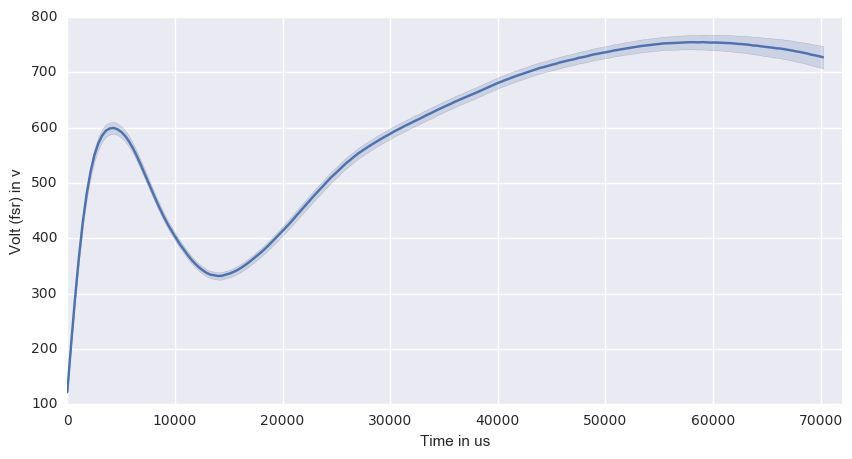

In [1200]:
response_only_df.columns = np.arange(1, 128)
response_only_df = response_only_df.stack().reset_index()
response_only_df.columns = ['time', 'epoch', 'response']
response_only_df['time'] = response_only_df['time']*360
fig, axes = plt.subplots(ncols=1, figsize=(10,5))
ax = sns.tsplot(data=response_only_df, 
                time='time', 
                unit='epoch', 
                value='response', 
                ax=axes)
ax.set_xlim(0, 72000)
ax.set_xlabel('Time in us')
ax.set_ylabel('Volt (fsr) in v')
plt.show()

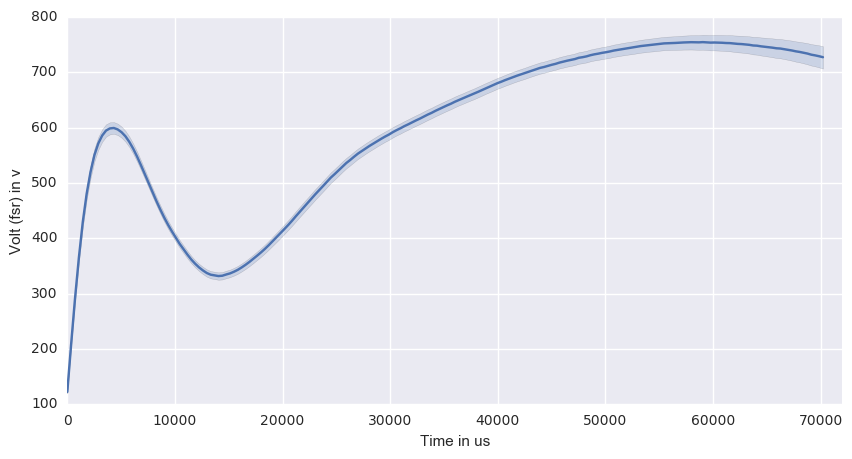

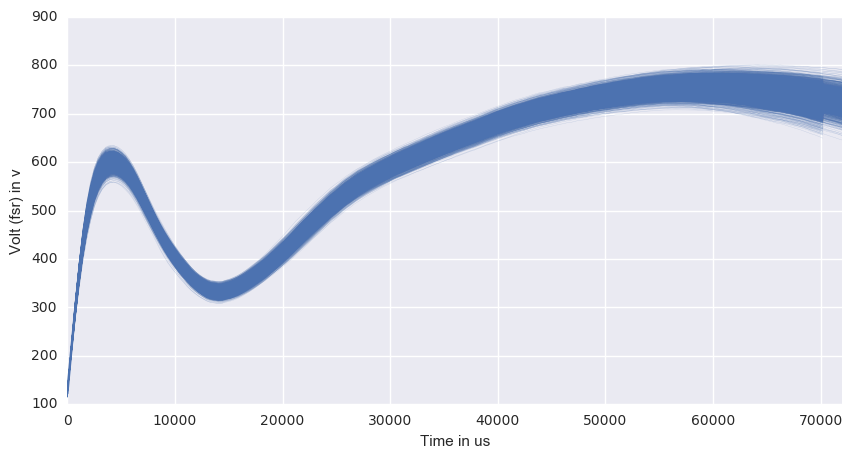

In [1168]:
fig, axes = plt.subplots(ncols=1, figsize=(10,5))
ax = sns.tsplot(data=response_only_df, 
                time='time', 
                unit='epoch', 
                value='response', 
                err_style='boot_traces',
                ax=axes)
ax.set_xlim(0, 72000)
ax.set_xlabel('Time in us')
ax.set_ylabel('Volt (fsr) in v')
plt.show()

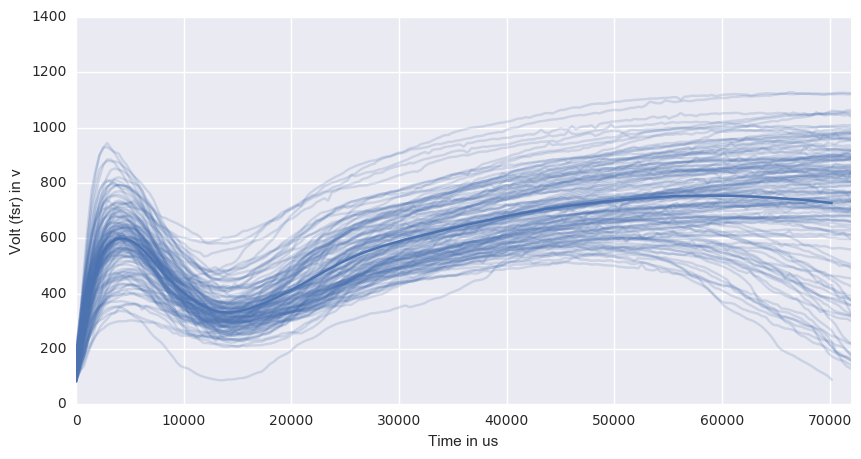

In [1170]:
fig, axes = plt.subplots(ncols=1, figsize=(10,5))
ax = sns.tsplot(data=response_only_df, 
                time='time', 
                unit='epoch', 
                value='response', 
                err_style='unit_traces',
                ax=axes)
ax.set_xlim(0, 72000)
ax.set_xlabel('Time in us')
ax.set_ylabel('Volt (fsr) in v')
plt.show()

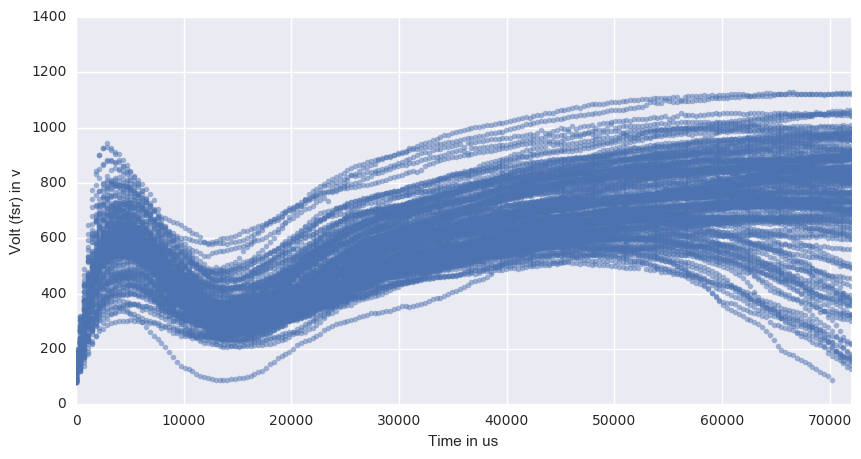

In [1171]:
fig, axes = plt.subplots(ncols=1, figsize=(10,5))
ax = sns.tsplot(data=response_only_df, 
                time='time', 
                unit='epoch', 
                value='response', 
                err_style='unit_points',
                ax=axes)
ax.set_xlim(0, 72000)
ax.set_xlabel('Time in us')
ax.set_ylabel('Volt (fsr) in v')
plt.show()

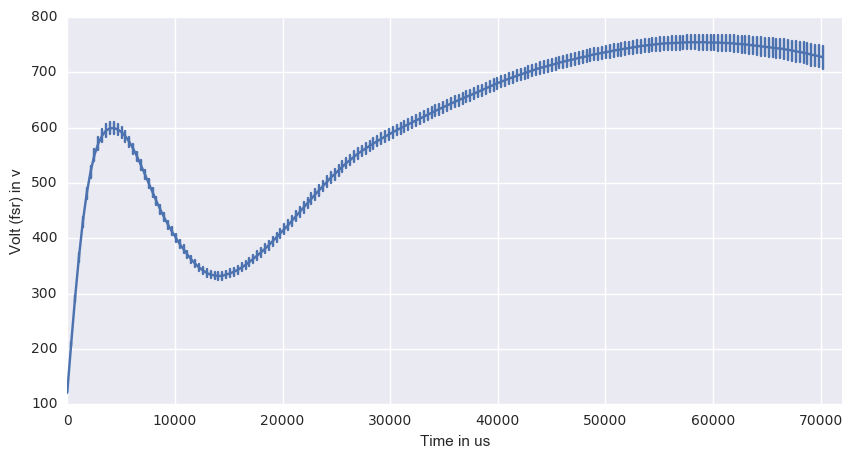

In [1172]:
fig, axes = plt.subplots(ncols=1, figsize=(10,5))
ax = sns.tsplot(data=response_only_df, 
                time='time', 
                unit='epoch', 
                value='response', 
                err_style='ci_bars',
                ax=axes)
ax.set_xlim(0, 72000)
ax.set_xlabel('Time in us')
ax.set_ylabel('Volt (fsr) in v')
plt.show()

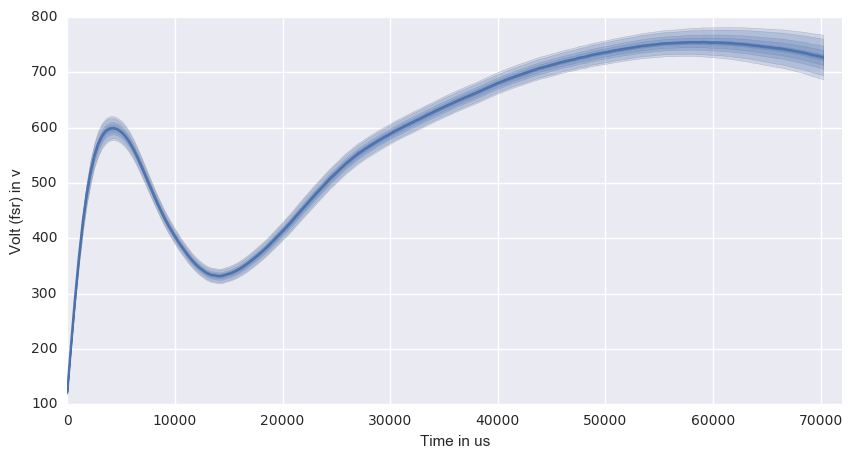

In [1190]:
fig, axes = plt.subplots(ncols=1, figsize=(10,5))
ax = sns.tsplot(data=response_only_df, 
                time='time', 
                unit='epoch', 
                value='response', 
#                 err_style='ci_band',
#                 color='g',
#                 interpolate=False,
#                 n_boot=5000,
                ci=[1,10,20,50,70,90,95],
                ax=axes)
ax.set_xlim(0, 72000)
ax.set_xlabel('Time in us')
ax.set_ylabel('Volt (fsr) in v')
plt.show()

# Ignore below for now

## Peak estimation in the raw data

(13100, 13400)

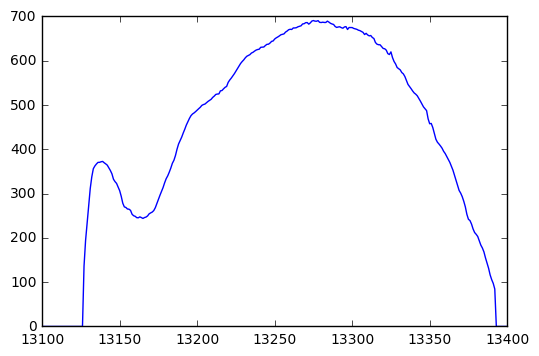

In [824]:
plt.plot(data_split[8]['volt(fsr)[v]'])
plt.xlim(13100, 13400)

In [365]:
indexes

array([687, 711, 899])

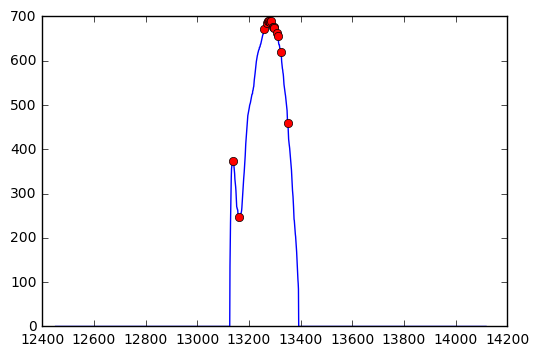

In [397]:
plt.plot(data_split[8]['volt(fsr)[v]'])
indexes = peakutils.indexes(data_split[8]['volt(fsr)[v]'], thres=0.1)

plt.plot(data_split[8].index.values[indexes], data_split[8]['volt(fsr)[v]'].values[indexes], 'ro')


In [410]:
indexes[np.abs(np.gradient(data_split[8]['volt(fsr)[v]'])[indexes]).argmin()]

829

In [400]:
len(data_split[8])

1667

In [411]:
len(np.gradient(data_split[8]['volt(fsr)[v]']))

1667

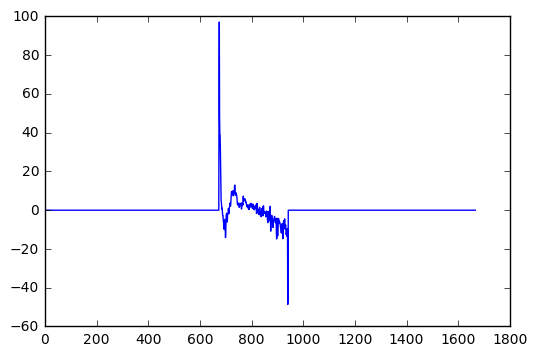

In [390]:
plt.plot(np.gradient(data_split[8]['volt(fsr)[v]']))

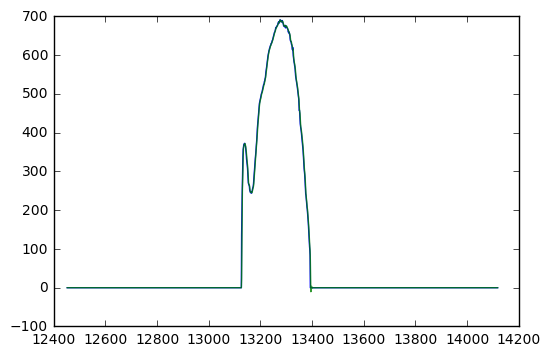

In [460]:
plt.plot(data_split[8].index.values, data_split[8]['volt(fsr)[v]'])
plt.plot(data_split[8].index.values, butter_lowpass_filter(data_split[8]['volt(fsr)[v]'], 200, 800, 3), alpha=0.8)

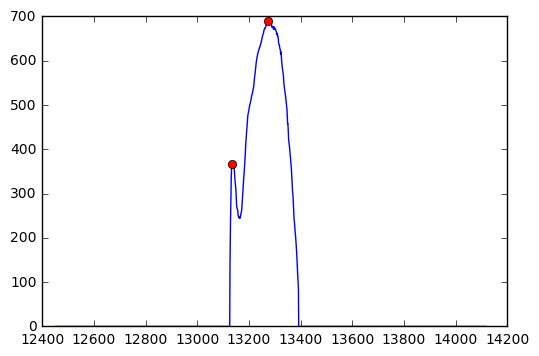

In [500]:
peaks = find_peaks_cwt(data_split[8]['volt(fsr)[v]'], np.arange(1,30))
peaks = [peaks[0]] + [peaks[data_split[8]['volt(fsr)[v]'].values[peaks].argmax()]]
plt.plot(data_split[8].index.values, data_split[8]['volt(fsr)[v]'])
plt.plot(data_split[8].index.values[peaks], data_split[8]['volt(fsr)[v]'].values[peaks], 'ro')

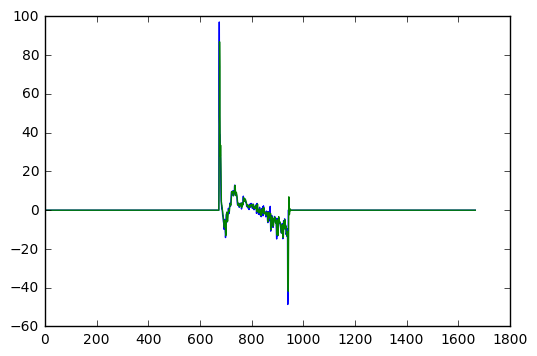

In [470]:
plt.plot(np.gradient(data_split[8]['volt(fsr)[v]']))
plt.plot(butter_lowpass_filter(np.gradient(data_split[8]['volt(fsr)[v]']), 200, 800, 3))

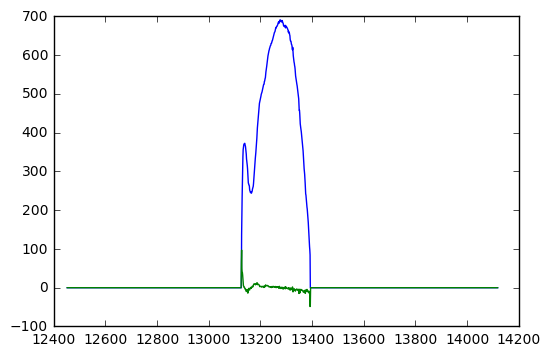

In [413]:
plt.plot(data_split[8]['volt(fsr)[v]'].index, data_split[8]['volt(fsr)[v]'])
plt.plot(data_split[8]['volt(fsr)[v]'].index, np.gradient(data_split[8]['volt(fsr)[v]']))

In [435]:
data_split[8].ix[(data_split[8]['volt(fsr)[v]'] > 0)]['gradient'].abs().argmin()


13165

In [443]:
data_split[8].ix[(data_split[8]['volt(fsr)[v]'] > 0)]['gradient'].abs().sort_values()

13165     0.023611
13299     0.065934
13281     0.067467
13275     0.101939
13280     0.145429
13163     0.253213
13282     0.282730
13260     0.311634
13263     0.313019
13272     0.326389
13242     0.334715
13284     0.373270
13309     0.466807
13277     0.565928
13290     0.590411
13213     0.606648
13311     0.656707
13137     0.695091
13317     0.701370
13291     0.728022
13276     0.753315
13292     0.754795
13294     0.796259
13162     0.876389
13255     0.981102
13302     1.002740
13239     1.002770
13297     1.010870
13300     1.027397
13138     1.038039
           ...    
13150    10.519668
13391    10.622961
13326    10.800000
13385    11.133137
13366    11.236111
13352    11.336565
13348    11.345833
13372    11.481887
13387    11.715278
13367    11.740997
13368    11.745845
13152    11.900000
13133    12.364716
13186    12.502778
13386    12.544737
13389    12.865278
13187    12.968144
13353    13.222222
13388    13.401662
13374    14.030556
13151    14.115651
13373    14.

243.86980609418282

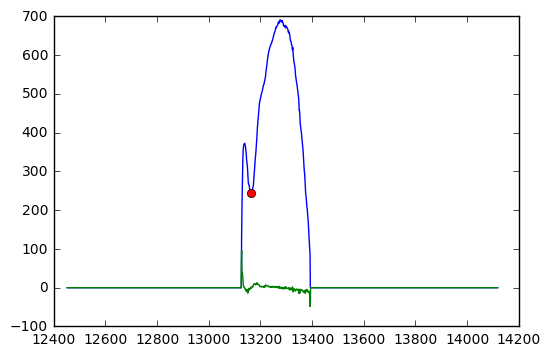

In [440]:
plt.plot(data_split[8]['volt(fsr)[v]'].index, data_split[8]['volt(fsr)[v]'])
plt.plot(data_split[8]['volt(fsr)[v]'].index, np.gradient(data_split[8]['volt(fsr)[v]']))
plt.plot(13165, data_split[8].ix[13165, 'volt(fsr)[v]'], 'ro')

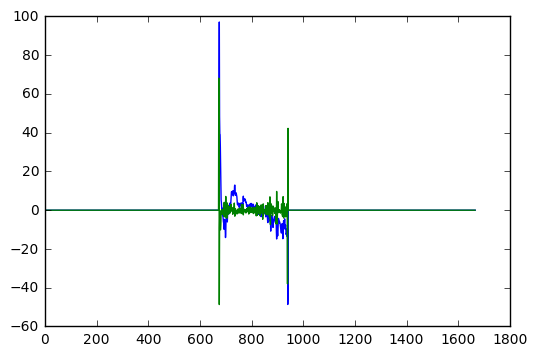

In [395]:
plt.plot(np.gradient(data_split[8]['volt(fsr)[v]']))
plt.plot(np.ediff1d(np.gradient(data_split[8]['volt(fsr)[v]'])))

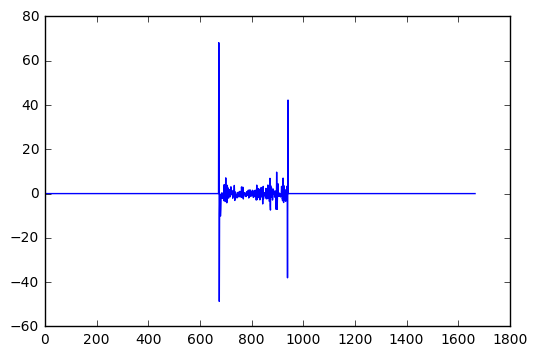

In [396]:
plt.plot(np.ediff1d(np.gradient(data_split[8]['volt(fsr)[v]'])))

In [355]:
from scipy import signal

In [356]:
np.arange(0, len(data_split[8]), 300)

array([   0,  300,  600,  900, 1200, 1500])

In [357]:
signal.find_peaks_cwt(data_split[8]['volt(fsr)[v]'], np.arange(1, 450))

[869]

In [358]:
data_split[8]['volt(fsr)[v]'][data_split[8].index.values[signal.find_peaks_cwt(data_split[8]['volt(fsr)[v]'], np.arange(1, 300))]]

13321    627.0
Name: volt(fsr)[v], dtype: float64

In [359]:
data_split[8]['volt(fsr)[v]'].index.values

array([12452, 12453, 12454, ..., 14116, 14117, 14118])

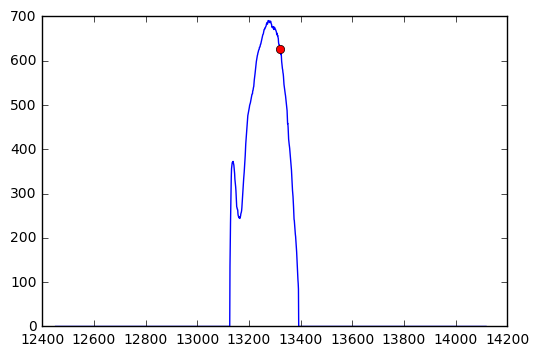

In [360]:
plt.plot(data_split[8]['volt(fsr)[v]'])
plt.plot(data_split[8].index.values[signal.find_peaks_cwt(data_split[8]['volt(fsr)[v]'], np.arange(1, 2000))],
         data_split[8]['volt(fsr)[v]'][data_split[8].index.values[signal.find_peaks_cwt(data_split[8]['volt(fsr)[v]'], np.arange(1, 2000))]],
         'ro')
# data_split[8].index.values[835]

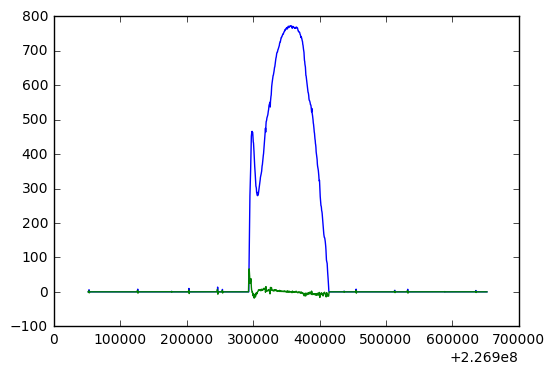

In [153]:
plt.plot(data_split[8]['time[us]'], data_split[8]['volt(fsr)[v]'])
plt.plot(data_split[8]['time[us]'], np.gradient(data_split[8]['volt(fsr)[v]']))
# data_split[8].index.values[835]

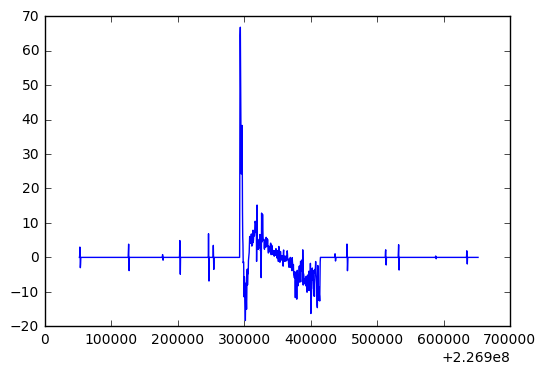

In [154]:
plt.plot(data_split[8]['time[us]'], np.gradient(data_split[8]['volt(fsr)[v]']))

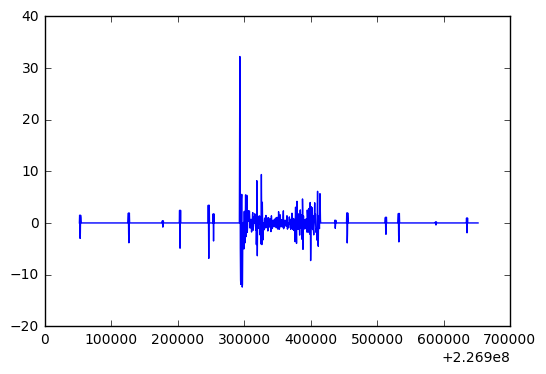

In [155]:
plt.plot(data_split[8]['time[us]'], np.gradient(np.gradient(data_split[8]['volt(fsr)[v]'])))

> ## Smoothing

KeyError: 0

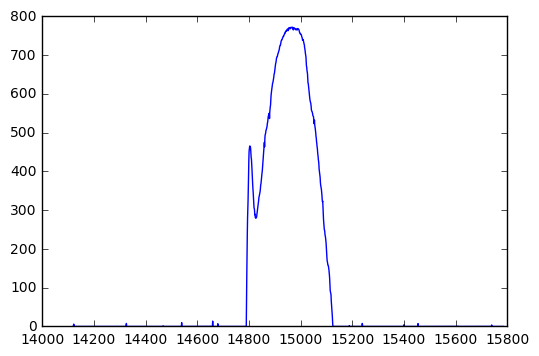

In [165]:
plt.plot(data_split[8]['volt(fsr)[v]'])
plt.plot(savitzky_golay(data_split[8]['volt(fsr)[v]'], 101, 3))

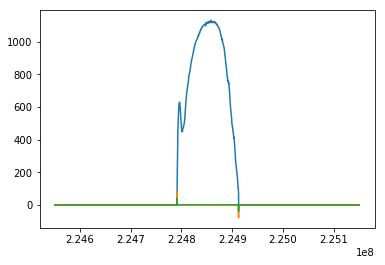

In [828]:
plt.plot(df_tmp.index, df_tmp['volt(fsr)[v]'])
plt.plot(df_tmp.index[1:], np.ediff1d(df_tmp['volt(fsr)[v]']))
plt.plot(df_tmp.index, np.gradient(df_tmp['volt(fsr)[v]']))

In [853]:
np.gradient(df_tmp['volt(fsr)[v]'])

array([ 0.,  0.,  0., ...,  0.,  0.,  0.])

In [855]:
np.gradient?

In [863]:
peakData = indexes(data['volt(fsr)[v]'])

In [864]:
peakData.shape

(4621,)

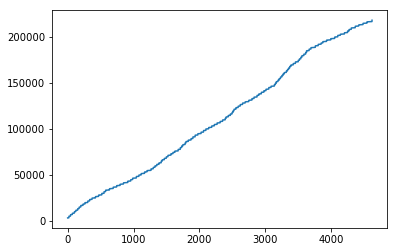

In [866]:
plt.plot(peakData)

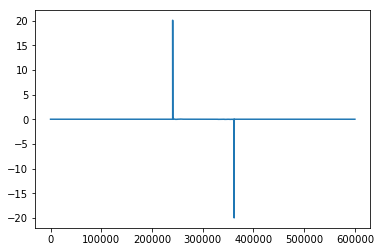

In [856]:
plt.plot(np.gradient(df_tmp['volt(fsr)[v]'], 2))

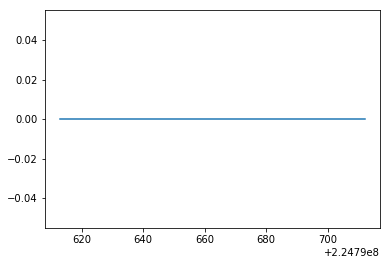

In [852]:
# plt.plot(df_tmp.index[:300000], df_tmp['volt(fsr)[v]'][:300000])
plt.plot(df_tmp.index[240000:240100], np.gradient(df_tmp['volt(fsr)[v]'][240000:240100]))

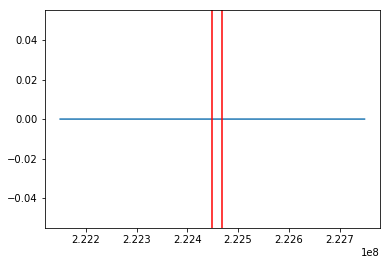

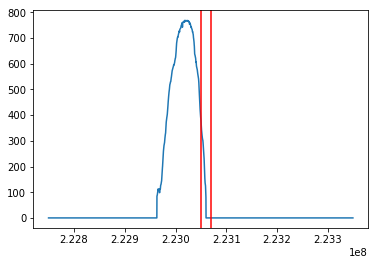

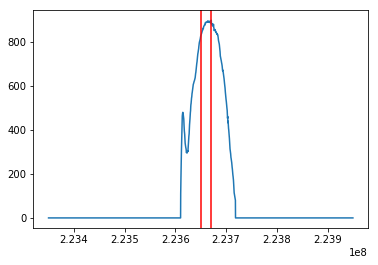

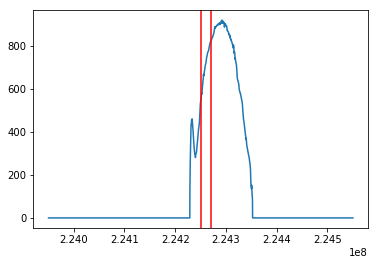

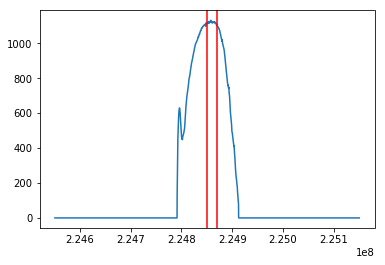

In [813]:
for signal_on_first, signal_on_last in zip(signal_first_ones_time[:5],
                                           signal_last_ones_time[:5]):
    df_tmp = data_thr.loc[signal_on_first - cut_window : signal_on_first + cut_window]
    plt.plot(df_tmp['volt(fsr)[v]'])
    plt.axvline(signal_on_first, color = 'r')
    plt.axvline(signal_on_last, color = 'r')
    
    print(np.gradient(df_tmp['volt(fsr)[v]']))
    # Peak
#     peak = indexes(df_tmp['volt(fsr)[v]'], thres=0.3, min_dist=100000)
#     print(peak)
    plt.show()

In [508]:
indexes(data_split[0]['volt(fsr)[v]'], thres=0.999, min_dist=len(data_split[0]))

array([566])

In [506]:
df = pd.DataFrame()
for num, (df, onset_marker) in enumerate(zip(data_split[:5],
                                             signal_first_ones_index[:5])):

    response_peak_index = indexes(df['volt(fsr)[v]'],
                                  thres=0.999, 
                                  min_dist=len(df))
    
    p

,time[us],volt(fsr)[v],signal,signal frequency[Hz]
0,221869028,0,0,1000
1,221869389,0,0,1000
2,221869750,0,0,1000
3,221870110,0,0,1000
4,221870470,0,0,1000


In [502]:
len(data_split)

132

In [ ]:
# window span = onset +- onset_diff/2
onset_index = data['time[us]'].loc[high_peak_indexes].index.values
onset_index_diff_div2 = np.ediff1d(onset_index)/2
onset_index_diff_div2_round = np.round(onset_index_diff_div2)

window_span_index = onset_index[:-1] + onset_index_diff_div2_round

# split the data using the window_span_index
subject_response_series = data['volt(fsr)[v]']
subject_response_index = subject_response_series.index.values
subject_response_index_split = np.split(subject_response_index, 
                                        window_span_index.astype('int'))
subject_response_data = [subject_response_series.loc[x] for x in subject_response_index_split]

signal_data = [signal_data.loc[x] for x in subject_response_index_split]

In [496]:
# difference between consecutive element
pre_post_signal_diff = np.ediff1d(data['signal'])

# where the difference is +1 : Signal turning on (0 --> 1)
# 1 has been added to return the index of first 'on'
signal_first_ones_index = np.where(pre_post_signal_diff==1)[0] + 1
data.loc[signal_first_ones_index, 'signal_timing'] = 'first_on'

# where the difference is -1 : Signal turning off (1 --> 0)
signal_last_ones_index = np.where(pre_post_signal_diff==-1)[0]
data.loc[signal_last_ones_index, 'signal_timing'] = 'last_on'

In [497]:
data['signal_timing'].unique()

array([nan, 'first_on', 'last_on'], dtype=object)

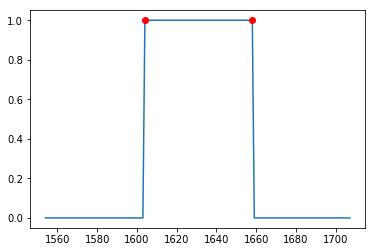

In [478]:
plt.plot(data['signal'][signal_first_ones_index[0]-50:signal_last_ones_index[0]+50])
plt.plot(signal_first_ones_index[0], 1, 'ro')
plt.plot(signal_last_ones_index[0], 1, 'ro')

In [408]:
len(data[data['signal']==1]['time[us]'])

7151

In [406]:
np.ediff1d(data[data['signal']==1]['time[us]'])>10000

array([False, False, False, ..., False, False,  True], dtype=bool)

In [390]:
data[data['signal']==1]['time[us]'].loc[1604]

222449262.0

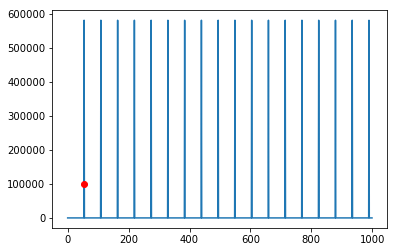

In [376]:
plt.plot(data['signal'])
plt.plot(np.ediff1d(data[data['signal']==1]['time[us]'])[:1000])
plt.plot(54, 100000, 'ro')
plt.show()

> Estimate gradient

In [293]:
signal_gradient = np.gradient(data['signal'])

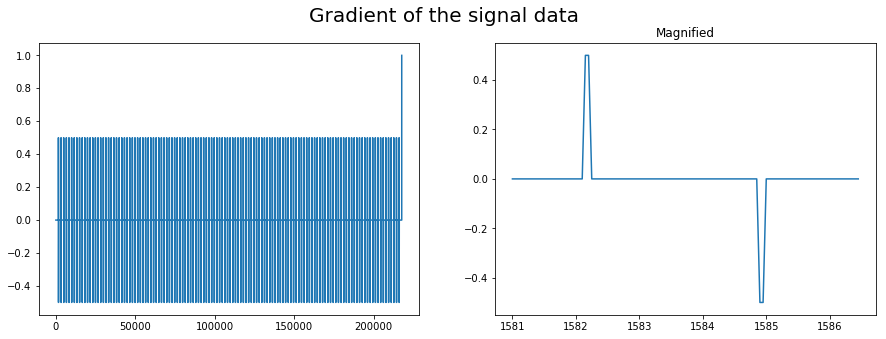

In [296]:
fig, axes = plt.subplots(ncols=2, 
                         figsize=(15,5))
axes[0].plot(signal_gradient)
axes[1].plot(signal_gradient[1580:1690])
axes[1].set_title('Magnified')
axes[1].set_xticklabels(data['signal'].index.values[1580:1690])
fig.suptitle('Gradient of the signal data', fontsize=20)

plt.show()

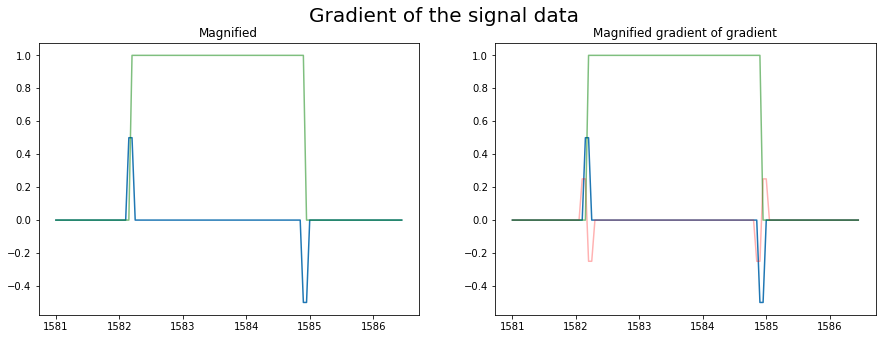

In [342]:
fig, axes = plt.subplots(ncols=2, 
                         figsize=(15,5))

axes[0].plot(signal_gradient[1580:1690])
axes[0].plot(data['signal'].values[1580:1690], 
             'g', 
             alpha=0.5)

axes[0].set_title('Magnified')
axes[0].set_xticklabels(data['signal'].index.values[1580:1690])

axes[1].plot(signal_gradient[1580:1690])
axes[1].plot(np.gradient(signal_gradient)[1580:1690], 'r', alpha=0.3)
axes[1].plot(data['signal'].values[1580:1690], 
             'g', 
             alpha=0.5)

axes[1].set_title('Magnified gradient of gradient')
axes[1].set_xticklabels(data['signal'].index.values[1580:1690])


fig.suptitle('Gradient of the signal data', fontsize=20)

plt.show()

- Positive peak : onset time
- Negative peak : offset time
- Time between those two peaks : duration

> Peak estimation of the signal gradient data

In [96]:
high_peak_indexes = indexes(signal_gradient, thres=0.3, min_dist=1000)
low_peak_indexes = indexes(-signal_gradient, thres=0.3, min_dist=1000)

> Plot the gradient data

In [307]:
high_peak_indexes[0]

1603

In [311]:
low_peak_indexes[0]

1658

In [313]:
[data['time[us]'].values[1603], data['time[us]'].values[1658]]

[222448901.0, 222468959.0]

In [317]:
hot.set_xticks?

In [316]:
hot.set_xticklabels?

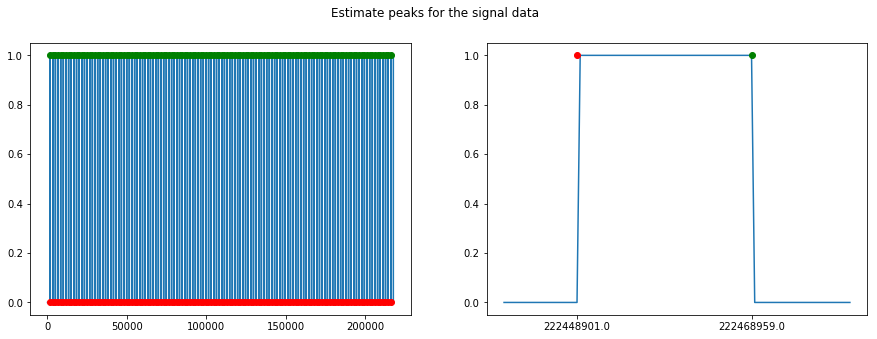

In [321]:
fig, axes = plt.subplots(ncols=2, figsize=(15,5))
axes[0].plot(data['signal'])
axes[0].plot(high_peak_indexes, data['signal'][high_peak_indexes], 'ro')
axes[0].plot(low_peak_indexes, data['signal'][low_peak_indexes], 'go')


axes[1].plot(data['signal'][1580:1690])
axes[1].plot(high_peak_indexes[0], data['signal'][high_peak_indexes[0]+1], 'ro')
axes[1].plot(low_peak_indexes[0], data['signal'][low_peak_indexes[0]], 'go')

axes[1].set_xticks([high_peak_indexes[0], low_peak_indexes[0]])
axes[1].set_xticklabels([data['time[us]'].values[1603], 
                         data['time[us]'].values[1658]])

plt.suptitle('Estimate peaks for the signal data')
plt.show()

> Return timing information

In [90]:
diff_onset = np.ediff1d(data['time[us]'].loc[high_peak_indexes])
diff_offset = np.ediff1d(data['time[us]'].loc[low_peak_indexes])
duration = data['time[us]'].loc[low_peak_indexes].values - data['time[us]'].loc[high_peak_indexes].values

print('Number of onsets : {}'.format(len(diff_onset)+1))
print('Number of offsets : {}'.format(len(diff_offset)+1))

Number of onsets : 130
Number of offsets : 130


In [91]:
tmp_df = pd.DataFrame({'Onset':[diff_onset.mean(), diff_onset.std()],
                      'Offset':[diff_offset.mean(), diff_offset.std()],
                      'Duration':[duration.mean(), duration.std()]}).T
tmp_df.columns = ['Mean [us]', 'Std [us]']
tmp_df

,Mean [us],Std [us]
Duration,20060.230769,1.638660
Offset,600330.937984,20.313341
Onset,600330.914729,20.130593


# Analysis 2 : Estimating subject reponse delay

In [63]:
peak_indexes = indexes(data['volt(fsr)[v]'], thres=0.3, min_dist=1000)

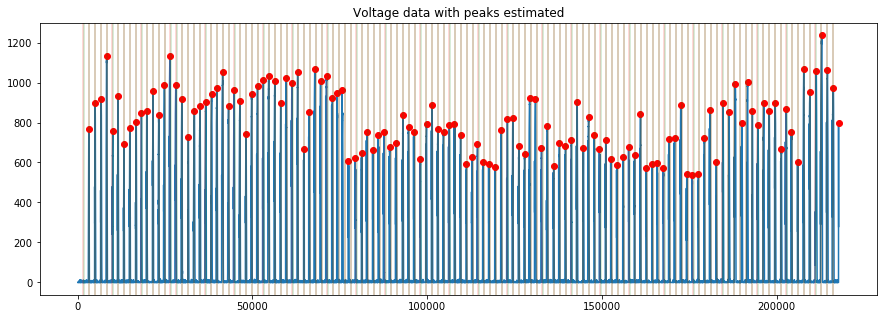

In [106]:
fig = plt.figure(figsize=(15,5))
plt.plot(data['volt(fsr)[v]'])
plt.plot(peak_indexes, data['volt(fsr)[v]'][peak_indexes], 'ro')

#sound on
for xc in high_peak_indexes:
    plt.axvline(x=xc, color='r', alpha=0.2)

#sound off
for xc in low_peak_indexes:
    plt.axvline(x=xc, color='g', alpha=0.2)

plt.title('Voltage data with peaks estimated')
plt.show()

In [66]:
print('Number of peaks : {}'.format(len(peak_indexes)))

Number of peaks : 130


> Split the subject reponse data 

- 2017_09_16

In [238]:
# window span = onset +- onset_diff/2
onset_index = data['time[us]'].loc[high_peak_indexes].index.values
onset_index_diff_div2 = np.ediff1d(onset_index)/2
onset_index_diff_div2_round = np.round(onset_index_diff_div2)

window_span_index = onset_index[:-1] + onset_index_diff_div2_round

# split the data using the window_span_index
subject_response_series = data['volt(fsr)[v]']
subject_response_index = subject_response_series.index.values
subject_response_index_split = np.split(subject_response_index, 
                                        window_span_index.astype('int'))
subject_response_data = [subject_response_series.loc[x] for x in subject_response_index_split]

signal_data = [signal_data.loc[x] for x in subject_response_index_split]

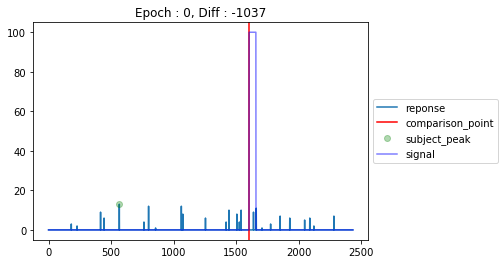

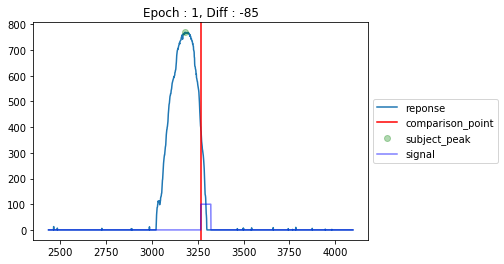

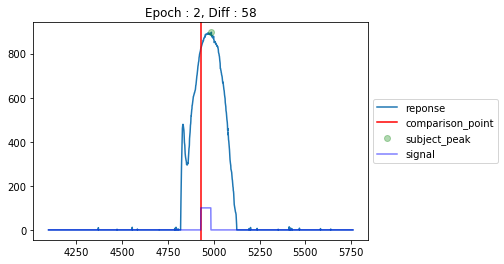

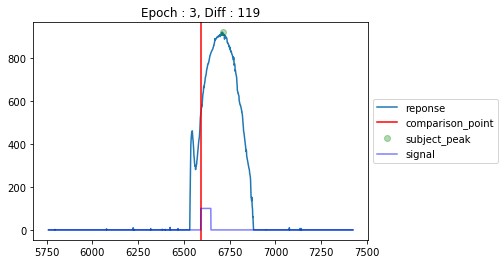

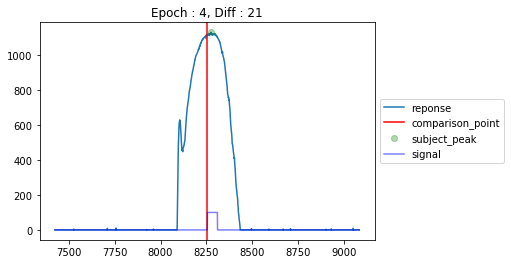

...

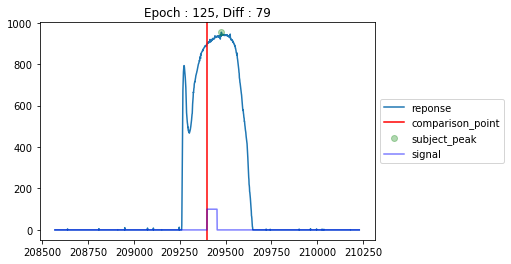

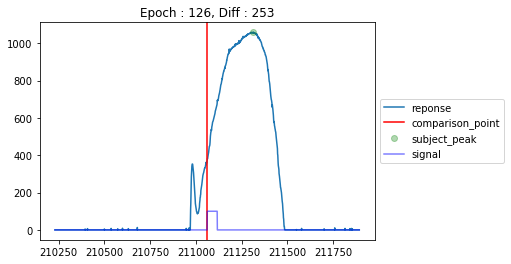

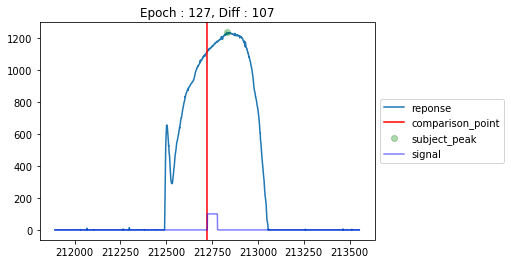

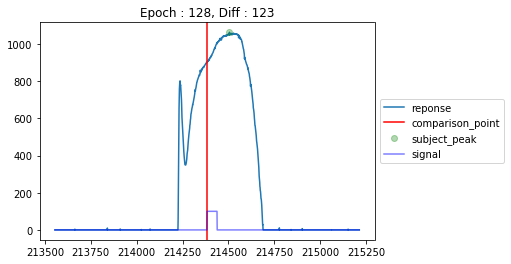

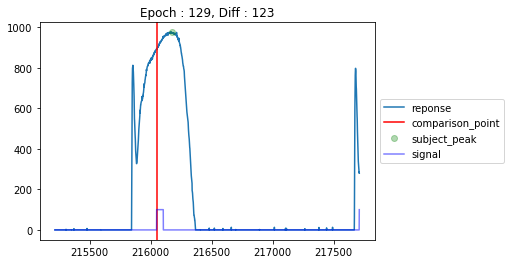

In [256]:
df = pd.DataFrame()
for num, (subject_response_df, onset_marker, signal) in enumerate(zip(subject_response_data,
                                                                      onset_index,
                                                                      signal_data)):
    peak_index = indexes(subject_response_df, 
                         thres=0.999, 
                         min_dist=len(subject_response_df))
#     peak_diff = subject_response_df.index[peak_index].values - onset_marker 
    
    tmp = pd.DataFrame({'epoch':[num],
                        'response_peak_index':peak_index,
                        'response_peak_time':subject_response_df.index[peak_index].values,
                        'response_peak_value':subject_response_df.values[peak_index],
                        'signal_peak_time':onset_marker,
                       })
    tmp['response_diff_time'] = tmp['response_peak_time'] - tmp['signal_peak_time']
    df = pd.concat([df, tmp])
    

    plt.plot(subject_response_df, label='reponse')
    plt.axvline(x=onset_marker, color='r', label='comparison_point')
    
    plt.plot(subject_response_df.index[peak_index].values, 
             subject_response_df.values[peak_index], 'go', alpha=0.3,
            label='subject_peak')

    plt.plot(signal*100, 'b', alpha=0.5, label='signal')
    plt.title('Epoch : {}, Diff : {}'.format(num, tmp['response_diff_time'].values[0]))
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()
    


In [257]:
df

,epoch,response_peak_index,response_peak_time,response_peak_value,signal_peak_time,response_diff_time
0,0,566,566,13.0,1603,-1037
0,1,746,3181,769.0,3266,-85
0,2,889,4987,897.0,4929,58
0,3,950,6711,920.0,6592,119
0,4,852,8276,1132.0,8255,21
0,5,938,10023,758.0,9914,109
0,6,796,11540,933.0,11575,-35
0,7,823,13228,692.0,13234,-6
0,8,848,14914,773.0,14897,17
0,9,1008,16737,803.0,16560,177


In [261]:
df.to_csv('~/Downloads/temporal_recalibration_raw.csv')

In [260]:
df.describe().to_csv('~/Downloads/temporal_recalibration_info.csv')

# Ignore below

> Difference between the time onset and the peak

In [75]:
subject_diff = data['time[us]'].loc[peak_indexes].values - data['time[us]'].loc[high_peak_indexes].values

In [77]:
print('Mean of the difference : {}'.format(subject_diff.mean()))
print('Std of the difference : {}'.format(subject_diff.std()))

Mean of the difference : 565772.9769230769
Std of the difference : 77951.7547707422
